# Overview

This notebook visualizes cells from the following three datasets in a joint embedding space generated using Structural clusters.

- sample ["Brain8"](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM3768152) from the [Jiang et al. 2021](https://www.frontiersin.org/articles/10.3389/fcell.2021.743421/full) zebrafish cell atlas
- sample ["Brain1"](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM2906405) from the [Han et al. 2018](https://www.sciencedirect.com/science/article/pii/S0092867418301168#sec4) mouse cell atlas
- sample ["Xenopus_brain_COL65"](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSM6214268) from the [Liao et al. 2022](https://www.nature.com/articles/s41467-022-31949-2) Xenopus laevis adult cell atlas


# 0. Setup

Import packages and specify any important functions here.

In [1]:
# import standard python packages
import pandas as pd
import subprocess
import os
import dill
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns
import numpy as np
import arcadia_pycolor as apc

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=apc.arcadia_All_ordered.values())
mpl.rcParams['pdf.fonttype'] = 42

# add the utils and env directories to the path
import sys
sys.path.append('../../utils/')
sys.path.append('../../env/')

# import functions from utils directory files
from string_functions import *
from biofile_handling import *
from scanpy_wrappers import *

# import paths to software installs from env
from install_locs import *

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.7


# 1. Collect BioFileDockets for each starting dataset
Collects BioFileDockets for each of the species datasets in the `species_dict`.

This `dict` expects key:value pairs in the form of `species`:`conditions` and is passed to the MultiSpeciesBioFileDocket class, which creates a folder in `output/` for the analysis.

The folder name takes the following format:

- `species_concat` + `_` + `global_conditions` + `analysis_type`

Where `species_concat` is the string concatenation of the alphabetize list of species prefixes.

In [2]:
################
# general info #
################

species_dict = {
    'Danio_rerio': 'adultbrain',
    'Mus_musculus': 'adultbrain',
    'Xenopus_laevis': 'adultbrain'
}

global_conditions = 'adultbrain'

analysis_type = 'FoldSeek'

################

sample_MSD = MultiSpeciesBioFileDocket(
    species_dict = species_dict,
    global_conditions = global_conditions,
    analysis_type = analysis_type
    )

sample_MSD.get_BioFileDockets()
sample_MSD.s3_to_local()

/home/ec2-user/glial-origins/output/DrerMmusXlae_adultbrain_FoldSeek/ already exists
file GCF_000002035.5_GRCz10_genomic.gff already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/GCF_000002035.5_GRCz10_genomic.gff
file GCF_000002035.5_GRCz10_genomic.fna already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/GCF_000002035.5_GRCz10_genomic.fna
file GSM3768152_Brain_8_dge.txt already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/GSM3768152_Brain_8_dge.txt
file Drer_adultbrain_ZFIN_UniProtIDs.txt already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_adultbrain_ZFIN_UniProtIDs.txt
file Drer_adultbrain_uniprot-idmm.tsv already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_adultbrain_uniprot-idmm.tsv
file Drer_adultbrain_gtf-idmm.tsv already exists at /home/ec2-user/glial-origins/output/Drer_adultbrain/Drer_adultbrain_gtf-idmm.tsv
file GCF_000002035.5_GRCz10_genomic_cDNA.fna already exists at /home/ec2-us

# 2. Load Gxc/Exc matrices

Load in and inspect the genes by cells and embedding by cells matrices.

In [3]:
jointexc = pd.read_csv(sample_MSD.species_BioFileDockets['Drer'].StruCluster_jointexc.path, sep = '\t', nrows = 10)
display(jointexc)

,StruCluster,Drer_ACAATATATTGTACCTGA,Drer_ACGTTGATGGCGTAGAGA,Drer_AACCTAACCTGAATTTGC,Drer_CTCGCAGCCCTCTATGTA,Drer_ACGTTGCGTATTTAGTCG,Drer_AACCTATAGAGACCGACG,Drer_ACGAGCGCTGTGGCCTAG,Drer_GCGAATGGACATGGACAT,Drer_TCTACCGCTCAAGCTCAA,...,Xlae_TCACTTGTTGCCATGCTT,Xlae_TCGGGTTGTCACACTTAT,Xlae_TCGTAATCGTAAGTTGCC,Xlae_TGTCACGAATTACACAAG,Xlae_TGTGCGTACTTCTAGTCG,Xlae_TTAACTATACAGTGGATG,Xlae_TTGGACACTTATGATCTT,Xlae_AAAGTTACTTATGCCCTC,Xlae_AACCTACGCACCTGCGGA,Xlae_AACCTATAGTCGCTGTGT
0,SC1,0,0,0,0,0,0,1,2,2,...,0,0,0,0,0,0,0,0,0,0
1,SC10008,0,0,1,0,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
2,SC10009,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,SC1002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,SC10021,2,0,0,1,1,0,0,3,1,...,0,0,0,0,0,0,0,0,0,0
5,SC10024,0,0,0,6,0,1,2,0,0,...,0,0,0,0,0,0,0,0,0,0
6,SC10025,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,SC10046,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,SC1005,0,1,2,0,1,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
9,SC10054,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Subsample the Xlae cells

For purposes of visualization and analysis, remove the ~90% of unannotated Xlae cells that had been excluded from previous analysis notebooks.

In [4]:
xlae_sub = pd.read_csv(sample_MSD.species_BioFileDockets['Xlae'].StruCluster_exc_sub.path, sep = '\t', nrows = 10)
xlae_sub_columns = ['Xlae_' + col for col in xlae_sub.columns if col != 'StruCluster']

drer_columns = [col for col in jointexc.columns if 'Drer' in col]
mmus_columns = [col for col in jointexc.columns if 'Mmus' in col]

usecols = ['StruCluster'] + xlae_sub_columns + drer_columns + mmus_columns

jointexc_subsampled_obj = JointExcFile(
    species_dict = sample_MSD.species_dict,
    sampledict = sample_MSD.sampledict,
    filename = sample_MSD.species_BioFileDockets['Drer'].StruCluster_jointexc.filename.replace('.tsv', '_subsampled.tsv'),
    embedding = 'StruCluster',
    sources = [sample_MSD.species_BioFileDockets[pre].StruCluster_exc for pre in sample_MSD.species_BioFileDockets]
)

if not os.path.exists(jointexc_subsampled_obj.path):
    jointexc_sub = pd.read_csv(sample_MSD.species_BioFileDockets['Drer'].StruCluster_jointexc.path, sep = '\t', usecols = usecols)

    jointexc_sub.to_csv(jointexc_subsampled_obj.path, index = None, sep = '\t')
sample_MSD.add_keyfile('StruCluster_jointexc_sub', jointexc_subsampled_obj)

### Calculate number of shared DE features

This represents the number of shared DE Structural clusters from all three species used to start the analysis.

In [5]:
de_features = set()

for i, pre in enumerate(sample_MSD.species_BioFileDockets):
    if i == 0:
        de_features.update(pd.read_csv(sample_MSD.species_BioFileDockets[pre].topStruClusters.path, header = None)[0].values)
    else:
        de_features.intersection(set(pd.read_csv(sample_MSD.species_BioFileDockets[pre].topStruClusters.path, header = None)[0].values))
        
display(len(de_features))

2623

# 3A. Load gxc matrix into scanpy

In [6]:
scanpy_data = ScanpyMetaObject(
    matrix = sample_MSD.StruCluster_jointexc_sub,
    sampledict = sample_MSD.sampledict
    )
scanpy_data.read(filter_set = de_features)

... reading from cache file cache/home-ec2-user-glial-origins-output-DrerMmusXlae_adultbrain_FoldSeek-DrerMmusXlae_adultbrain_asStruCluster_combined_exc_subsampled.h5ad


### Assign a `'species'` value for each cell

In [7]:
scanpy_data.adata.obs['species'] = [i.split('_')[0] for i in scanpy_data.adata.obs.index]

# 4A. Run basic filtering and regressions on gxc data
Each function call collapses several scanpy native functions into a single function.  
See the `utils/scanpy_wrapper.py` document for more details about the specific subfunctions.

normalizing counts per cell
    finished (0:00:00)


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


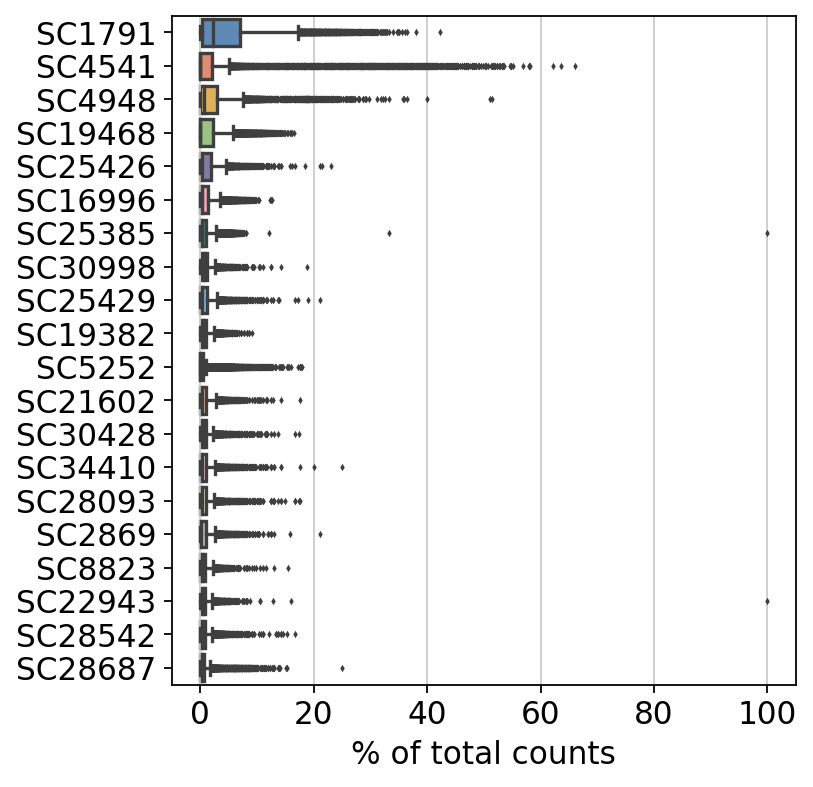

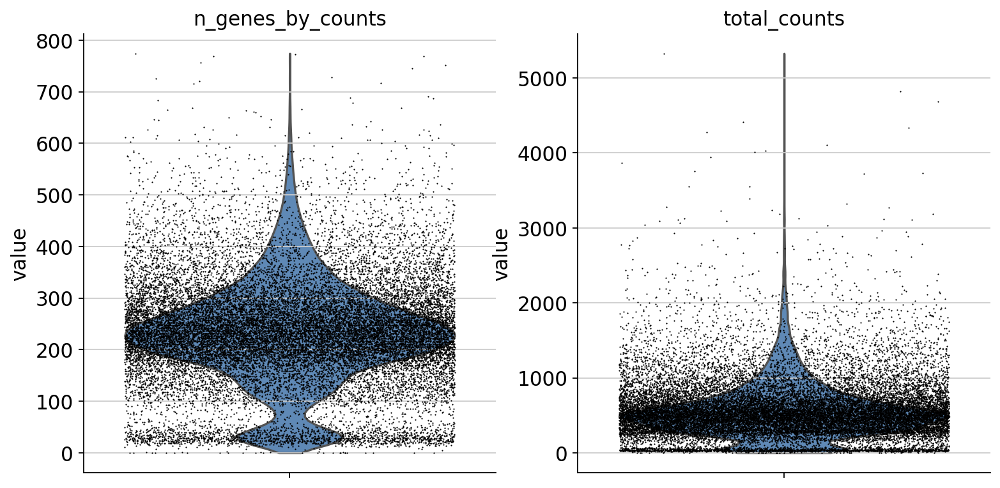

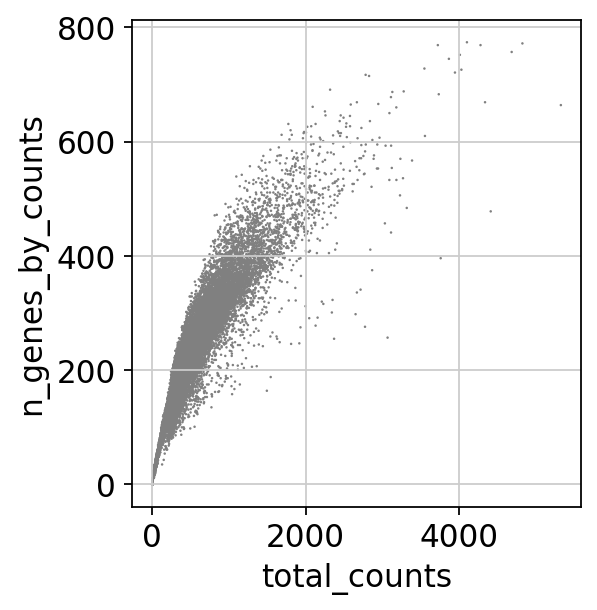

filtered out 1718 cells that have less than 50 genes expressed
normalizing counts per cell
    finished (0:00:00)


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


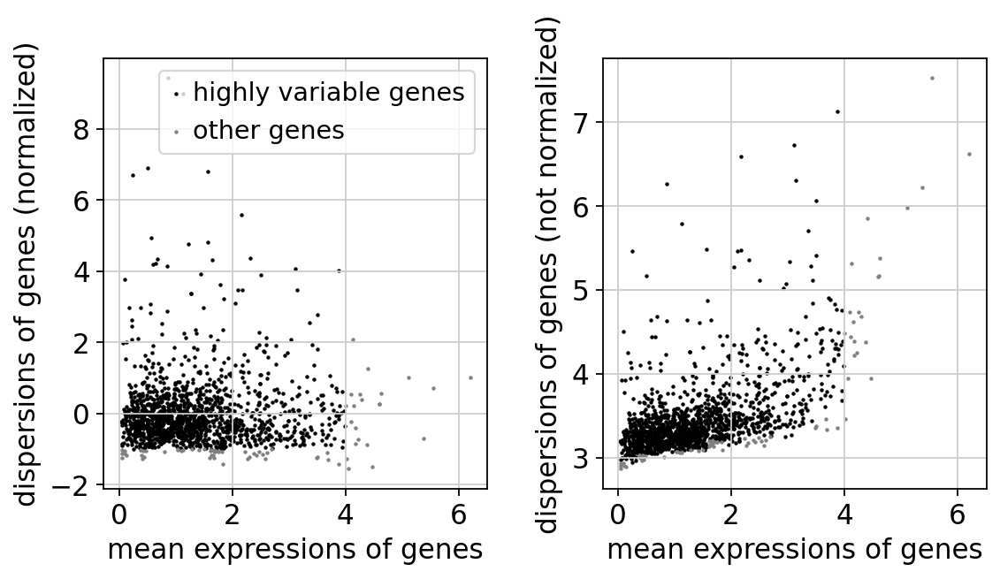

regressing out ['total_counts']
    finished (0:00:25)


In [8]:
sc.pl.highest_expr_genes(scanpy_data.adata, n_top=20, )
scanpy_data.violin()
scanpy_data.cellgene_filter(min_genes=50, min_cells=20)
scanpy_data.normalize(max_n_genes_by_counts = 7000, target_sum = 1e4)
scanpy_data.variable_filter(min_mean = 0.0125, max_mean = 4, min_disp = -1.0, max_disp = 10)
scanpy_data.regress_scale(how = ['total_counts'], max_value = 10)

### Map cell type annotations

In [9]:
scanpy_data.map_cellannots_multispecies(sample_MSD)

# 5A. Run PCA and UMAP/Leiden on gxc data

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


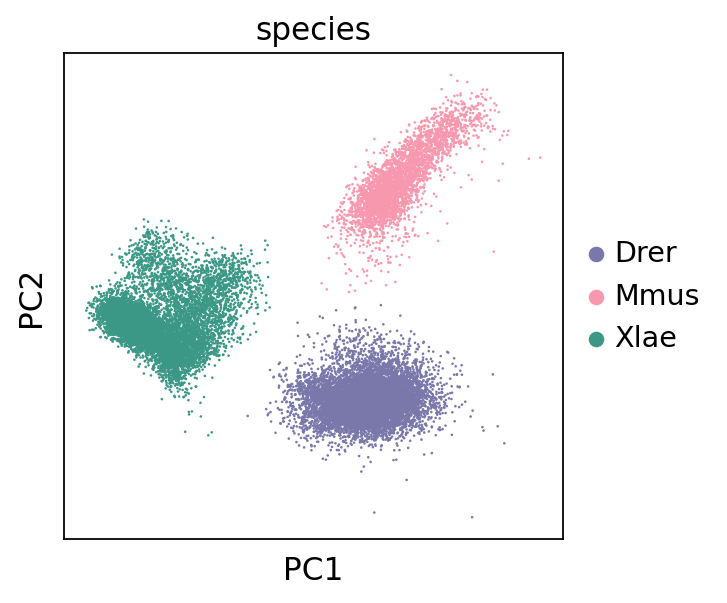

2023-04-12 19:22:12,526 - harmonypy - INFO - Iteration 1 of 10
2023-04-12 19:22:23,854 - harmonypy - INFO - Iteration 2 of 10
2023-04-12 19:22:35,310 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:41)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


In [10]:
species_palette = {'Drer': 'arcadia:aster', 'Mmus': 'arcadia:rose', 'Xlae': 'arcadia:seaweed'}

scanpy_data.pca_basic(color = ['species'], palette = species_palette)
sc.external.pp.harmony_integrate(scanpy_data.adata, 'species')

sc.pp.neighbors(scanpy_data.adata, n_neighbors=50, n_pcs = 40, use_rep = 'X_pca_harmony')
sc.tl.umap(scanpy_data.adata)
sc.tl.leiden(scanpy_data.adata)

### Plot UMAPs
Colored by:
- Leiden cluster
- species
- annotated cell type

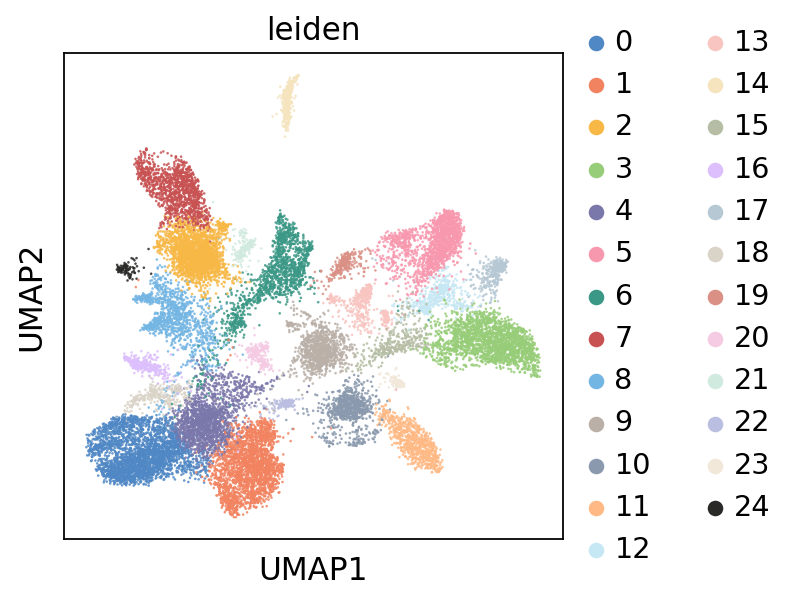

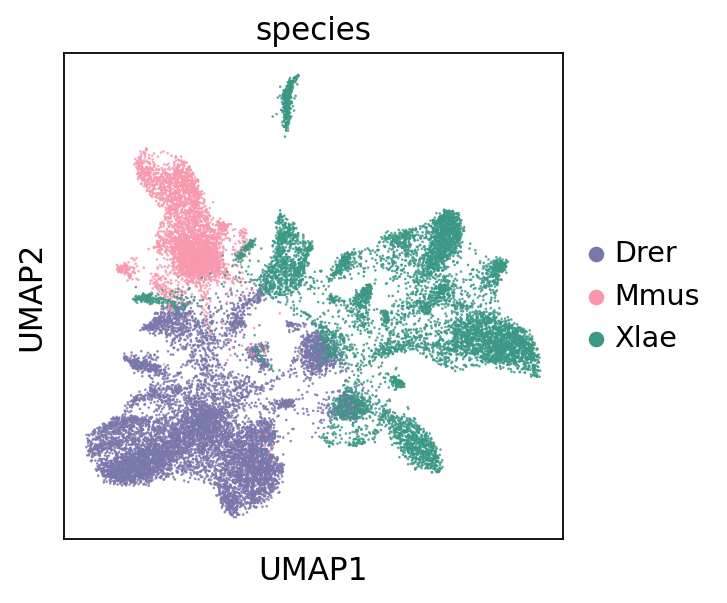

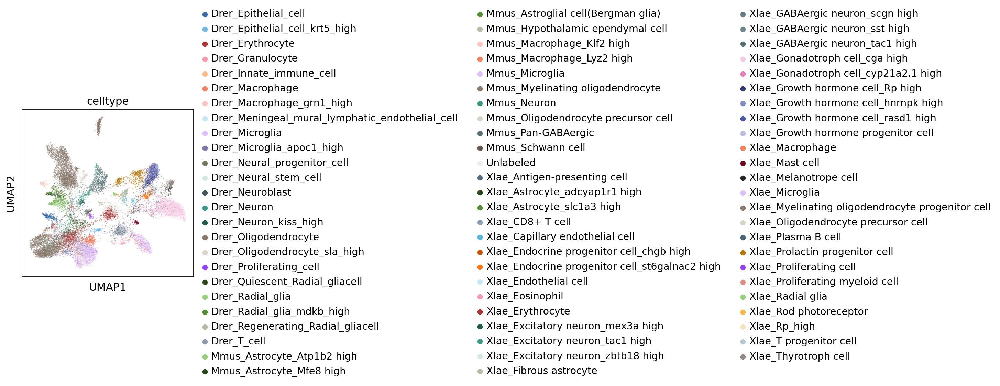

In [11]:
sc.pl.umap(scanpy_data.adata, alpha = 0.85, color = 'leiden', save = 'DrerMmusXlae_clusters-foldseek-v3.pdf', 
           palette = list(apc.arcadia_All_ordered.keys()) + ['arcadia:crow'])
sc.pl.umap(scanpy_data.adata, alpha = 0.85, color = ['species'], save = 'DrerMmusXlae_species-foldseek-v3.pdf', palette = species_palette)

drer_celltype_palette = {
    # unlabeled, lightgrey
    'Unlabeled': apc.arcadia_Core['arcadia:lightgrey'],
    
    # myeloid cells, dragon-orange-rose-amber
    'Erythrocyte': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:dragon'], 0.8),
    'Innate_immune_cell': apc.arcadia_Accent_all['arcadia:orange'],
    'Granulocyte': apc.arcadia_Accent_all['arcadia:rose'],
    'Macrophage': apc.arcadia_Accent_all['arcadia:amber'],
    'Macrophage_grn1_high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:dress'], 1),
    
    # lymphoid cells, 
    'T_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:marineblue'], 1),
    
    # radial glia: lime-sage
    'Regenerating_Radial_gliacell': apc.arcadia_Accent_all['arcadia:sage'],
    'Radial_glia': apc.arcadia_Accent_all['arcadia:lime'],
    'Radial_glia_mdkb_high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.6),
    'Quiescent_Radial_gliacell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.3),
    
    # microglia, aster-periwinkle
    'Microglia': apc.arcadia_Accent_all['arcadia:periwinkle'],
    'Microglia_apoc1_high': apc.arcadia_Accent_all['arcadia:aster'],
    'Proliferating_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:periwinkle'], 0.7),
    
    # epithelial cells, aegean-wish-vitalblue
    'Epithelial_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:aegean'], 0.8),
    'Epithelial_cell_krt5_high': apc.arcadia_Accent_all['arcadia:vitalblue'],
    'Meningeal_mural_lymphatic_endothelial_cell': apc.arcadia_Accent_all['arcadia:bluesky'],
    
    # oligodendrocytes: chateau-taupe
    'Oligodendrocyte': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:chateau'], 0.7),
    'Oligodendrocyte_sla_high': apc.arcadia_Accent_all['arcadia:taupe'],
    
    # neuron: seaweed-mint-forest
    'Neuron': apc.arcadia_Accent_all['arcadia:seaweed'],
    'Neuron_kiss_high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:seaweed'], 0.6),
    'Neuroblast': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 0.8),
    'Neural_stem_cell': apc.arcadia_Accent_all['arcadia:mint'],
    'Neural_progenitor_cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:sage'], 0.6),
}
mmus_celltype_palette = {
    # unlabeled, lightgrey
    'Unlabeled': apc.arcadia_Core['arcadia:lightgrey'],
    
    'Macrophage_Lyz2 high': apc.arcadia_Accent_all['arcadia:amber'],
    'Macrophage_Klf2 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:dress'], 1),

    'Myelinating oligodendrocyte': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:chateau'], 0.7),
    'Oligodendrocyte precursor cell': apc.arcadia_Accent_all['arcadia:taupe'],
    'Schwann cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:chateau'], 0.5),
    
    'Neuron': apc.arcadia_Accent_all['arcadia:seaweed'],
    'Pan-GABAergic': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 1),
    
    'Astrocyte_Atp1b2 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 1),
    'Astrocyte_Mfe8 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.3),
    'Astroglial cell(Bergman glia)': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.6),
    'Hypothalamic ependymal cell': apc.arcadia_Accent_all['arcadia:sage'],
    
    'Microglia': apc.arcadia_Accent_all['arcadia:periwinkle'],
}
xlae_celltype_palette = {
    # unlabeled, lightgrey
    'Unlabeled': apc.arcadia_Core['arcadia:lightgrey'],
    
    # myeloid cells, dragon-orange-rose-amber
    'Erythrocyte': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:dragon'], 0.8),
    'Proliferating myeloid cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:mars'], 1),
    'Eosinophil': apc.arcadia_Accent_all['arcadia:rose'],
    'Macrophage': apc.arcadia_Accent_all['arcadia:amber'],
    'Mast cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:rose'], 0.3),
    
    # lymphoid cells
    'Antigen-presenting cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:marineblue'], 0.7),
    'T progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:denim'], 1),
    'CD8+ T cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:marineblue'], 1),
    'Plasma B cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:denim'], 0.5),
    
    # endocrine cells
    'Growth hormone progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 1),
    'Growth hormone cell_hnrnpk high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 0.8),
    'Growth hormone cell_rasd1 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 0.6),
    'Growth hormone cell_Rp high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:wish'], 0.4),
    'Thyrotroph cell': apc.arcadia_Neutral['arcadia:bark'],
    'Gonadotroph cell_cga high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:blossom'], 1),
    'Gonadotroph cell_cyp21a2.1 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:blossom'], 0.8),
    'Endocrine progenitor cell_st6galnac2 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:orange'], 0.7),
    'Endocrine progenitor cell_chgb high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:orange'], 0.5),
    'Melanotrope cell': apc.arcadia_Neutral['arcadia:crow'],
    'Prolactin progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:canary'], 0.6),
    
    # neuron: seaweed-mint-forest
    'Excitatory neuron_tac1 high': apc.arcadia_Accent_all['arcadia:seaweed'],
    'Excitatory neuron_zbtb18 high': apc.arcadia_Accent_all['arcadia:mint'],
    'Excitatory neuron_mex3a high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:seaweed'], 0.6),
    'GABAergic neuron_tac1 high': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 1),
    'GABAergic neuron_scgn high': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 1.1),
    'GABAergic neuron_sst high': apc.adjust_lightness(apc.arcadia_Core['arcadia:forest'], 1.2),
    
    # oligodendrocytes: chateau-taupe
    'Myelinating oligodendrocyte progenitor cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:chateau'], 0.7),
    'Oligodendrocyte precursor cell': apc.arcadia_Accent_all['arcadia:taupe'],
    
    # astrocytes
    'Fibrous astrocyte': apc.arcadia_Accent_all['arcadia:sage'],
    'Astrocyte_slc1a3 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.6),
    'Astrocyte_adcyap1r1 high': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:lime'], 0.3),
    'Radial glia': apc.arcadia_Accent_all['arcadia:lime'],
    
    # endothelial cell
    'Capillary endothelial cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:bluesky'], 0.7),
    'Endothelial cell': apc.arcadia_Accent_all['arcadia:bluesky'],
    
    # other
    'Rp_high': apc.arcadia_Accent_all['arcadia:oat'],
    'Rod photoreceptor':  apc.arcadia_Accent_all['arcadia:canary'],
    
    # microglia
    'Microglia': apc.arcadia_Accent_all['arcadia:periwinkle'],
    'Proliferating cell': apc.adjust_lightness(apc.arcadia_Accent_all['arcadia:periwinkle'], 0.7),
}

drer_celltype_palette_pre = {'Drer_' + key: value for key, value in drer_celltype_palette.items()}
mmus_celltype_palette_pre = {'Mmus_' + key: value for key, value in mmus_celltype_palette.items()}
xlae_celltype_palette_pre = {'Xlae_' + key: value for key, value in xlae_celltype_palette.items()}

full_celltype_palette = drer_celltype_palette_pre | mmus_celltype_palette_pre | xlae_celltype_palette_pre | {'Unlabeled': 'arcadia:lightgrey'}
sc.pl.umap(scanpy_data.adata, alpha = 0.5, color = ['celltype'], save = 'DrerMmusXlae_celltypes-foldseek-v3.pdf', palette = full_celltype_palette)

### Generate confusion matrix across species annotations

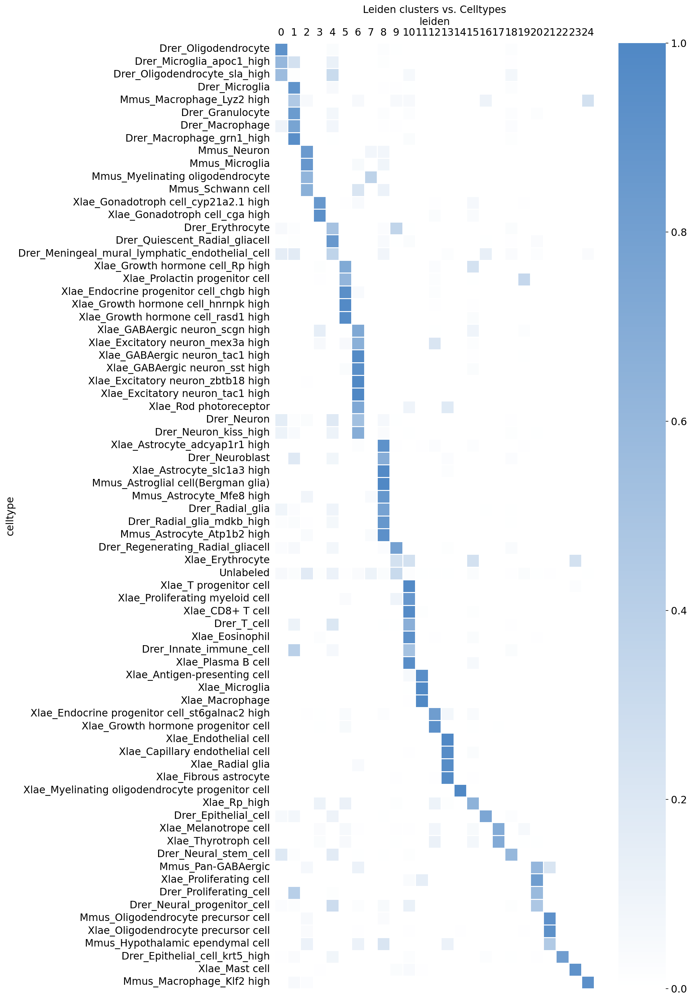

In [12]:
ctmx = sc.metrics.confusion_matrix("celltype", "leiden", scanpy_data.adata.obs)
ctmx_diag = diagonalize_df(ctmx)

plt.figure(figsize = (12, 24))
sns.heatmap(ctmx_diag, square = True, cmap = 'arcadia:aegeans', linewidth = 0.5)
plt.gca().xaxis.tick_top()
plt.gca().xaxis.set_label_position('top')
plt.tick_params(left = False, top = False)
plt.title('Leiden clusters vs. Celltypes')
plt.savefig('DrerMmusXlae_clusters_vs_celltypes-foldseek-v3.pdf')

# 6A. Get top marker genes and plot them

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/ec2-user/miniconda3/envs/glial_origins/lib/python3.10/site-packages/scanpy/tools/_ran

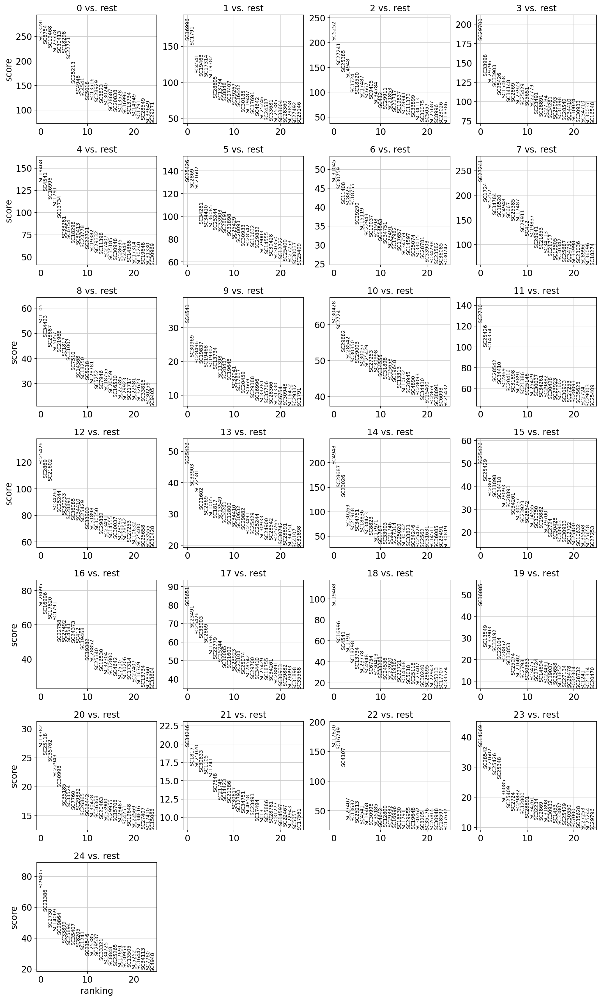

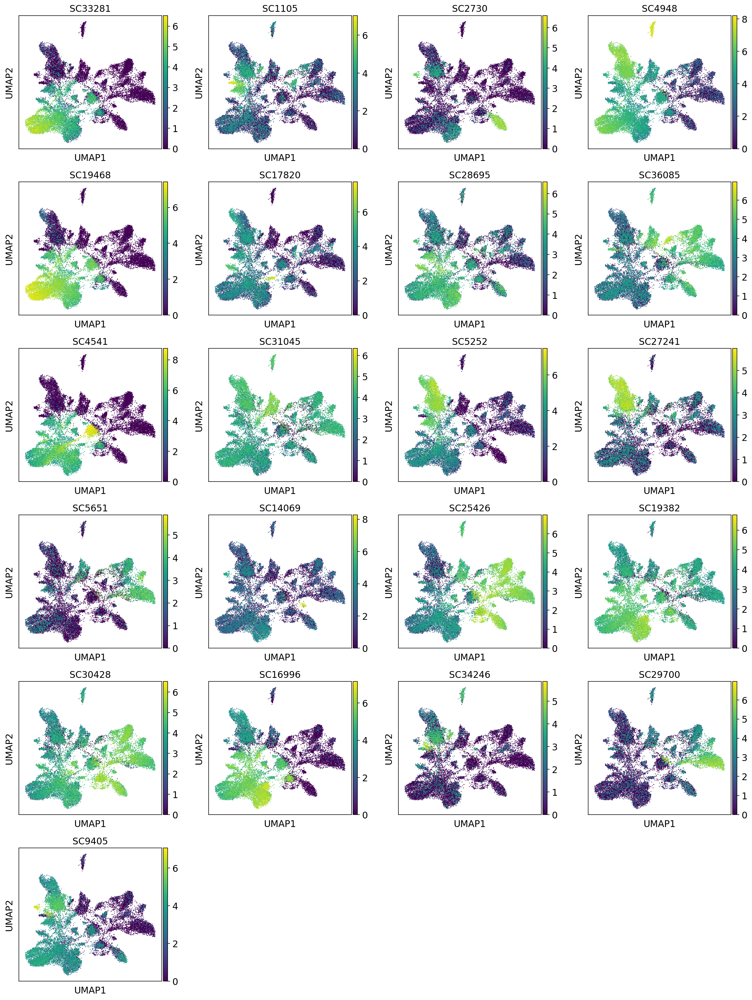

In [13]:
scanpy_data.rank_genes()
top_key, marker_key = scanpy_data.get_top_genes('gene-name')

# Running the line below exports top genes to file
#scanpy_data.export_top_genes(top_key)

sc.pl.umap(scanpy_data.adata, color=getattr(scanpy_data, marker_key))

# 7A. Cluster-specific genes

You can plot the `top_n` genes from a given `cluster_num` here for exploratory purposes.

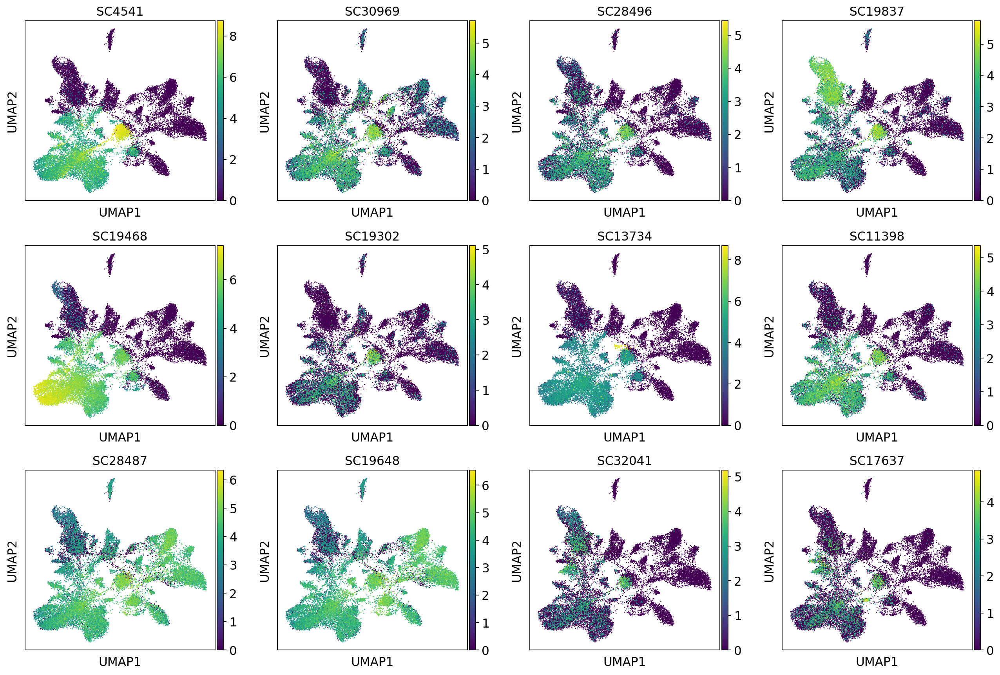

In [14]:
cluster_num = 9
top_n = 12

top_genelist = scanpy_data.marker_genes_df[str(cluster_num)].tolist()[0:top_n]

sc.pl.umap(scanpy_data.adata, color=top_genelist)

### Get mapping between top gene names and orthogroups for each species

In [15]:
glial_og_dict = {}

# Retrieve idmm object from BioFileDocket
for pre in sample_MSD.species_BioFileDockets:
    idmm_object = sample_MSD.species_BioFileDockets[pre].sc_idmm

    # Map gene names to orthogroup IDs
    glial_og_dict[pre] = scanpy_data.map_gene_to_id(idmm_object, top_genelist, 'StruCluster', 'gene_name', check_ids = False)

,StruCluster,gene_name
473,SC30969,nt5c2b
738,SC19468,si:dkeyp-80c12.8
1012,SC17637,aqp1a.1
1013,SC17637,aqp1a.2
1325,SC19837,ca8
1466,SC19837,cahz
1530,SC13734,epdr1
1543,SC32041,slc4a2a
2860,SC4541,si:ch211-5k11.6
2861,SC4541,hbaa1


,StruCluster,gene_name
586,SC11398,Creg2
1425,SC32041,Slc4a3
3259,SC11398,Creg1
5871,SC32041,Slc4a10
7084,SC19468,Cd59b
7087,SC19468,Cd59a
9860,SC19837,Car13
9861,SC19837,Car1
9863,SC19837,Car3
9864,SC19837,Car2


,StruCluster,gene_name
358,SC30969,nt5c2.L
1590,SC19648,rplp0.L
2022,SC17637,aqp7.L
2023,SC17637,aqp3.L
2676,SC19648,rplp0.S
2963,SC17637,aqp7.S
2964,SC17637,aqp3.S
3026,SC11398,creg1.L
3882,SC17637,mip.L
3973,SC17637,aqp2.L


# 8A. Calculate and export summary plots

### Add back `'species'`

In [16]:
scanpy_data.adata.obs['species'] = [i.split('_')[0] for i in scanpy_data.adata.obs.index]

### Collect data for export for **`plotly`** notebook

Data exported to this CSV is used in the `b_DrerMmusXlae_FoldSeek_plotly-testing.ipynb` notebook.

In [17]:
export_df = pd.DataFrame(scanpy_data.adata.obs).copy(deep = True)
export_df['umap_1'] = scanpy_data.adata.obsm['X_umap'][:, 1]
export_df['umap_2'] = scanpy_data.adata.obsm['X_umap'][:, 0]
export_df.reset_index(inplace = True)
export_df.rename(columns = {'index': 'barcode'}, inplace = True)

export_df.to_csv('_'.join([sample_MSD.species, sample_MSD.global_conditions, sample_MSD.analysis_type, 'plotlydata.tsv']), sep = '\t', index = None)

display(export_df)

,barcode,species,n_genes_by_counts,total_counts,n_genes,celltype,leiden,umap_1,umap_2
0,Drer_ACAATATATTGTACCTGA,Drer,478,4412.0,478,Unlabeled,10,-5.384692,3.673759
1,Drer_ACGTTGATGGCGTAGAGA,Drer,664,5326.0,664,Unlabeled,10,-5.552770,3.821268
2,Drer_AACCTAACCTGAATTTGC,Drer,757,4685.0,757,Unlabeled,8,-1.790851,-1.989658
3,Drer_CTCGCAGCCCTCTATGTA,Drer,772,4825.0,772,Drer_Radial_glia,8,-1.789272,-2.014703
4,Drer_ACGTTGCGTATTTAGTCG,Drer,571,2723.0,571,Drer_Regenerating_Radial_gliacell,9,-0.841303,2.748487
...,...,...,...,...,...,...,...,...,...
22191,Xlae_GTTGCCGCGTGCCCAGAC,Xlae,71,88.0,71,Unlabeled,9,-0.101422,2.694128
22192,Xlae_TATGTATAGTCGGCGTGC,Xlae,69,80.0,69,Unlabeled,9,-1.086472,4.491355
22193,Xlae_AACCTATTCATATAACGG,Xlae,51,58.0,51,Unlabeled,9,-1.123161,4.258444
22194,Xlae_CCGCTAATGGCGGCGTGC,Xlae,51,94.0,51,Unlabeled,9,-0.694779,3.935840


### Generate cluster x species summary plots

Circle plots show the proportion of cells from each species that comprise each cluster.  
Bar plot shows the number of clusters with 1, 2, or 3 species' cells.

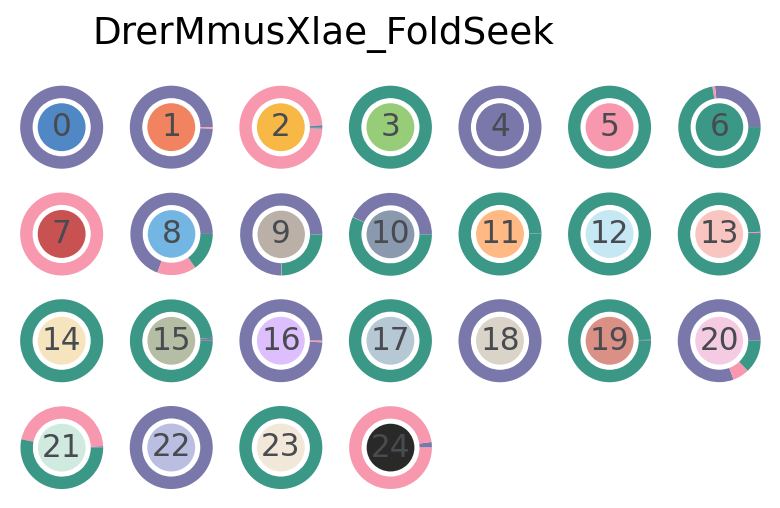

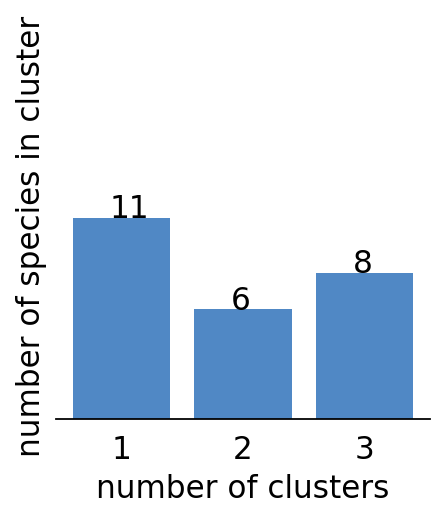

In [41]:
cluster_frac_container_1 = []
cluster_frac_container_2 = []
cluster_frac_container_3 = []

clust_color_list = list(apc.arcadia_All_ordered.keys()) + ['arcadia:crow']

for cluster_num in np.arange(0, max([int(i) for i in scanpy_data.adata.obs['leiden'].values]) + 1):
    cluster_cells = scanpy_data.adata[scanpy_data.adata.obs['leiden']==str(cluster_num)]
    cluster_1 = len(cluster_cells[cluster_cells.obs['species'] == 'Drer'])
    cluster_2 = len(cluster_cells[cluster_cells.obs['species'] == 'Mmus'])
    cluster_3 = len(cluster_cells[cluster_cells.obs['species'] == 'Xlae'])
    cluster_frac_container_1 = cluster_frac_container_1 + [cluster_1 / (cluster_1 + cluster_2 + cluster_3)]
    cluster_frac_container_2 = cluster_frac_container_2 + [cluster_2 / (cluster_1 + cluster_2 + cluster_3)]
    cluster_frac_container_3 = cluster_frac_container_3 + [cluster_3 / (cluster_1 + cluster_2 + cluster_3)]

plt.figure(figsize = (6, 6))

for cluster_num in np.arange(0, max([int(i) for i in scanpy_data.adata.obs['leiden'].values]) + 1):
    plt.subplot(7, 7, cluster_num + 1)
    plt.pie([cluster_frac_container_1[cluster_num], cluster_frac_container_2[cluster_num], cluster_frac_container_3[cluster_num]],
            colors = ['arcadia:aster', 'arcadia:rose', 'arcadia:seaweed'],
           wedgeprops=dict(width=0.3))
    circle = plt.Circle((0, 0), 0.55, color = clust_color_list[cluster_num])
    ax = plt.gca()
    ax.add_patch(circle)
    plt.text(0, 0, cluster_num, ha = 'center', va = 'center', color = 'arcadia:charcoal')
    ax.axis('equal')
plt.suptitle(sample_MSD.species + '_' + sample_MSD.analysis_type)

plt.savefig('figures/' + sample_MSD.species + '_' + sample_MSD.analysis_type + '_filtered_ringcharts.pdf')

species_categories = {1: 0, 2: 0, 3: 0}
for cluster_num in np.arange(0, max([int(i) for i in scanpy_data.adata.obs['leiden'].values]) + 1):
    species_count = 0
    if cluster_frac_container_1[cluster_num] > 0:
        species_count = species_count + 1
    if cluster_frac_container_2[cluster_num] > 0:
        species_count = species_count + 1
    if cluster_frac_container_3[cluster_num] > 0:
        species_count = species_count + 1
    species_categories[species_count] += 1

plt.figure(figsize = (3, 3))
plt.bar([str(i) for i in species_categories.keys()], species_categories.values(), color = 'arcadia:aegean')

for index, value in enumerate(species_categories.values()):
    plt.text(index - 0.1, value,
             str(value))
plt.xlabel('number of clusters')
plt.ylabel('number of species in cluster')
plt.ylim(0, 20)
plt.gca().grid(False)
plt.gca().tick_params(axis = 'both', bottom = False, left = False, labelleft = False)
plt.gca().spines[['right', 'top', 'left']].set_visible(False)

plt.savefig('figures/' + sample_MSD.species + '_' + sample_MSD.analysis_type + '_filtered_barchart.pdf')
plt.show()